In [1]:
import torch
from torch.utils.data import DataLoader, Subset
from torchvision import transforms
from torchvision.datasets import ImageFolder

from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import argparse
import os
from datetime import datetime

from gan.train import train
from gan.losses import discriminator_loss, generator_loss
from gan.models import Discriminator, Generator
from gan.utils import sample_noise, deprocess_img, show_images

%load_ext autoreload
%autoreload 2

In [2]:
def main(discriminator, generator, d_optimizer, g_optimizer, expt, imsize, batch_size, latent_dim, epochs, lr, num_images, dog_class):
    
    device = torch.device("cuda" if torch.cuda.is_available() else "gpu")
    
    if (expt == "cropped"):
        data_path = "/home/sk118/CS444_FinalProject/data/all-dogs-cropped/"
        expt_name = "cropped"
    elif (expt == "segmented"):
        data_path = "/home/sk118/CS444_FinalProject/data/all-dogs-segmented/"
        expt_name = "segmented"
    else:
        data_path = "/home/sk118/CS444_FinalProject/data/all-dogs/"
        expt_name = "not_cropped"

    dog_train = ImageFolder(root=data_path, transform=transforms.Compose([
        transforms.Resize(int(1.15 * imsize)),
        transforms.RandomCrop(imsize),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomApply([transforms.ColorJitter()], p=0.2),
        transforms.ToTensor()
    ]))
    
    if (dog_class is not None):
        expt_name += "_{}".format(dog_class)
        class_idx = dog_train.class_to_idx[dog_class]
        indices = []
        for i, image in enumerate(dog_train):
            if(image[1] == class_idx):
                indices.append(i)
                
        dog_train = Subset(dog_train, indices)

    dog_loader_train = DataLoader(dog_train, batch_size=batch_size, drop_last=True, shuffle=True)
    
    imgs, labels = next(iter(dog_loader_train))
    imgs = imgs.numpy().squeeze()
    show_images(imgs, color=True)
    
    D = discriminator
    G = generator
    D_optimizer = d_optimizer
    G_optimizer = g_optimizer
    
    model_save_path = "./checkpoints_/{}/".format(datetime.now())
    
    if not os.path.exists(model_save_path):
        os.makedirs(model_save_path)
        os.makedirs(model_save_path + "generator")
        os.makedirs(model_save_path + "discriminator")
    
    G, D = train(
        D, 
        G, 
        D_optimizer, 
        G_optimizer, 
        discriminator_loss, 
        generator_loss, 
        num_epochs = epochs,
        model_save_path = model_save_path,
        show_every = 75,
        batch_size = batch_size, 
        train_loader = dog_loader_train, 
        device = device,
        noise_size = latent_dim
    )
    
    result_dir = "/home/sk118/CS444_FinalProject/gan/results/{}_k_{}_epoch_{}_batch_size_{}_lr_{}/".format(expt_name, latent_dim, epochs, batch_size, lr)
    
    if not os.path.exists(result_dir):
        os.makedirs(result_dir)
        
    if not os.path.exists(result_dir + "generated/"):
        os.makedirs(result_dir + "generated/")
    
    for i in range(num_images):
        noise = sample_noise(batch_size, latent_dim).reshape(batch_size, latent_dim, 1, 1).to(device)
        fake_image = G(noise).reshape(batch_size, 3, imsize, imsize)
        disp_fake_image = deprocess_img(fake_image.data)
        img = (disp_fake_image).cpu().numpy()
        # img = np.squeeze(img, axis=0)
        img = img[0]
        img = np.transpose(img, (1, 2, 0))
        
        im = Image.fromarray((img * 255).astype(np.uint8))
        im.save(result_dir + "generated/{}.png".format(i))

EPOCH:  1
Iter: 0, D: 1.632, G:1.051


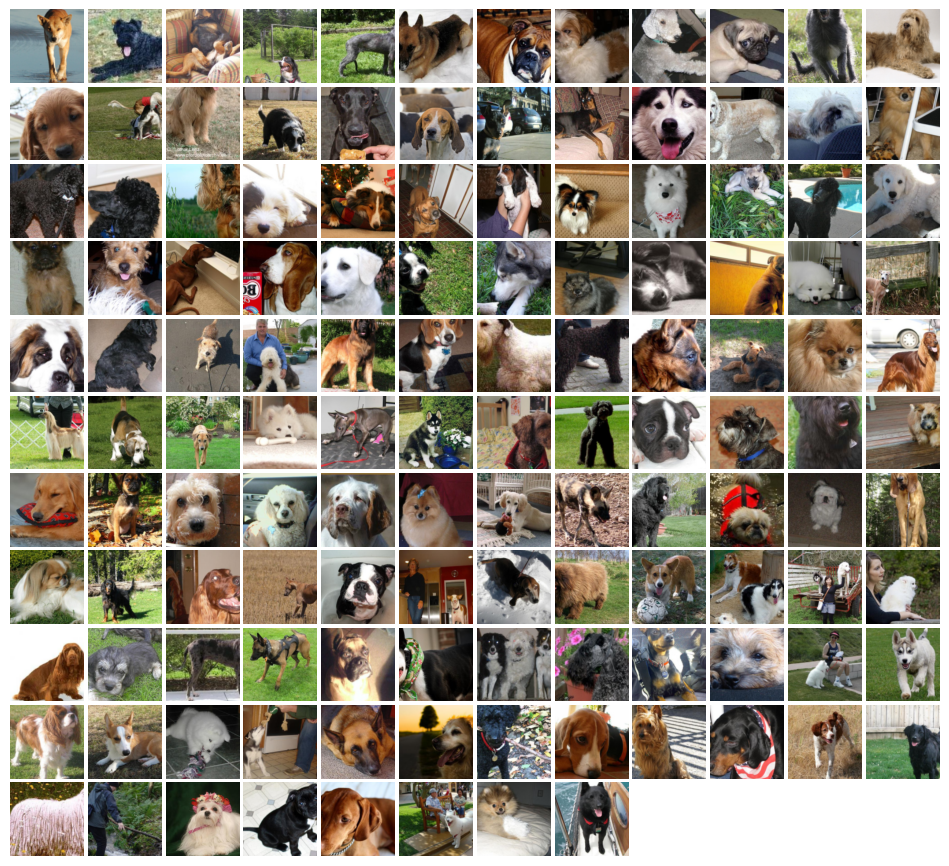

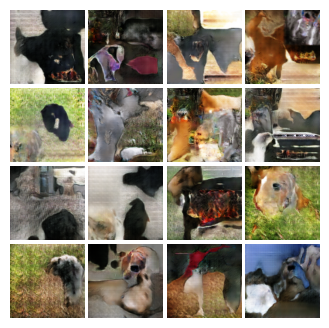

Iter: 75, D: 0.5733, G:0.9387


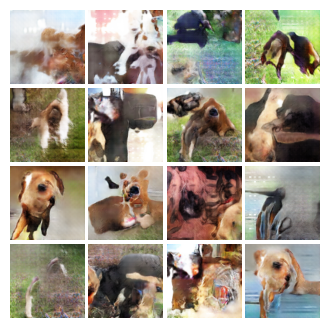

Iter: 150, D: 0.8095, G:1.64


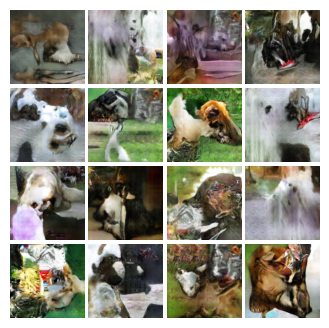

EPOCH:  2
Iter: 225, D: 0.647, G:0.9376


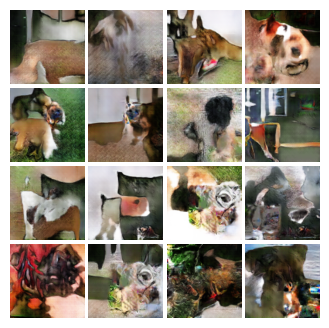

Iter: 300, D: 0.6895, G:1.009


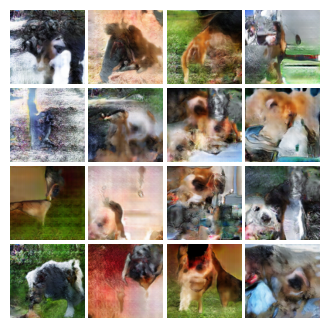

EPOCH:  3
Iter: 375, D: 0.7277, G:0.9837


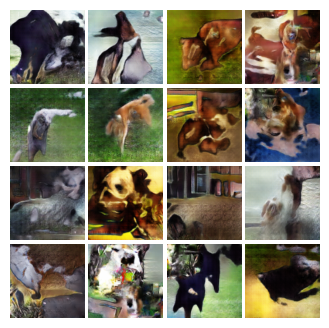

Iter: 450, D: 0.8921, G:1.29


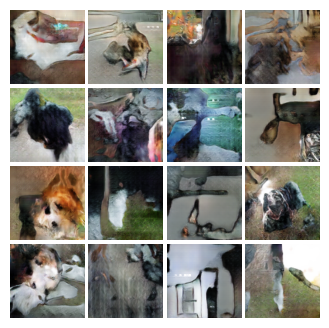

EPOCH:  4
Iter: 525, D: 1.064, G:1.022


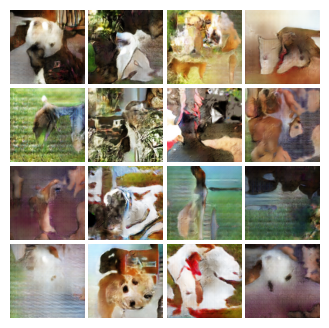

Iter: 600, D: 0.9161, G:1.452


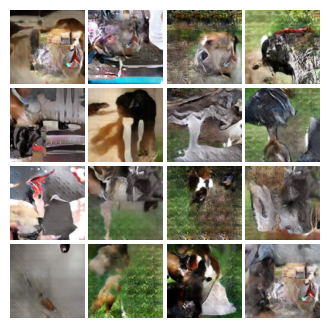

EPOCH:  5
Iter: 675, D: 1.167, G:1.027


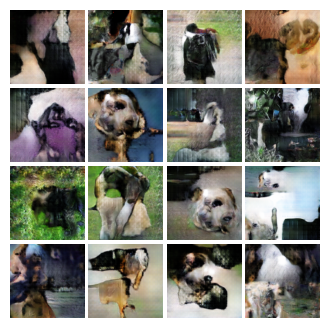

Iter: 750, D: 0.4697, G:1.252


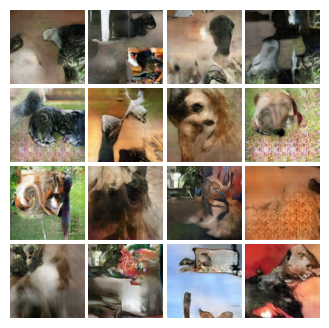

EPOCH:  6
Iter: 825, D: 0.7344, G:1.061


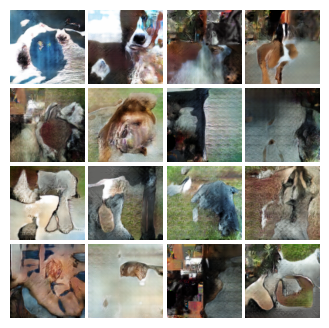

Iter: 900, D: 0.5796, G:1.24


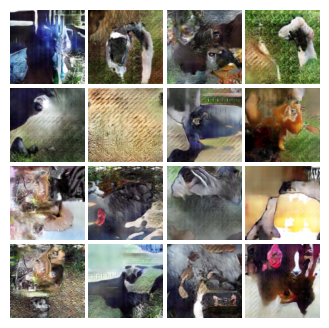

EPOCH:  7
Iter: 975, D: 0.6538, G:0.9638


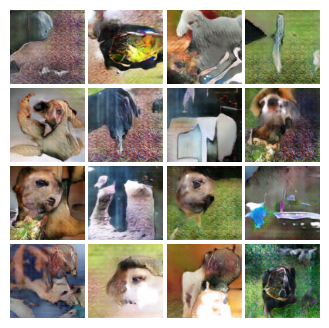

Iter: 1050, D: 0.5534, G:1.244


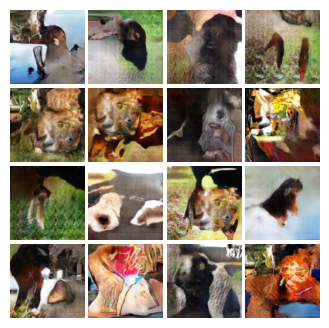

EPOCH:  8
Iter: 1125, D: 0.6203, G:1.074


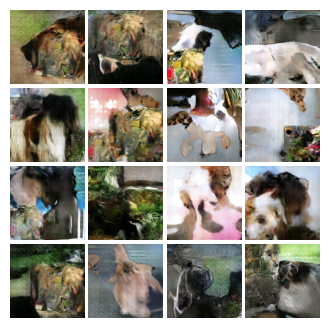

Iter: 1200, D: 0.6161, G:0.9198


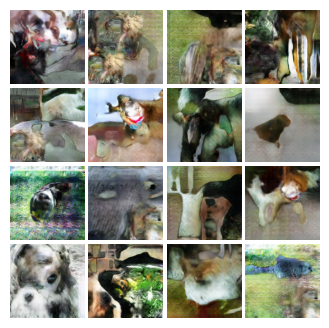

Iter: 1275, D: 0.6213, G:1.151


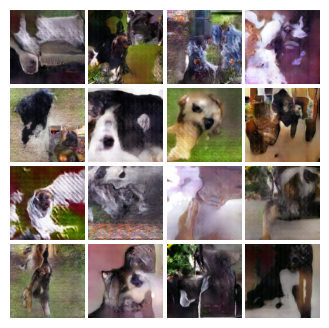

EPOCH:  9
Iter: 1350, D: 1.255, G:1.321


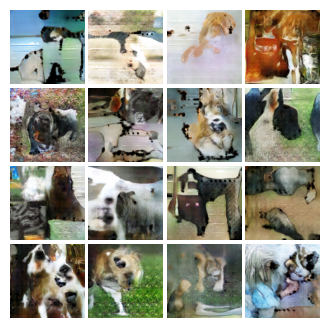

Iter: 1425, D: 0.7266, G:1.733


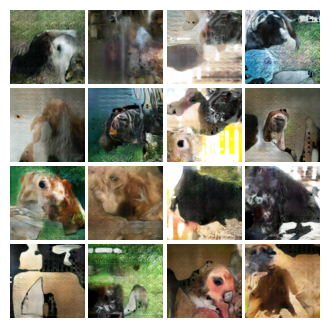

EPOCH:  10
Iter: 1500, D: 0.5851, G:1.499


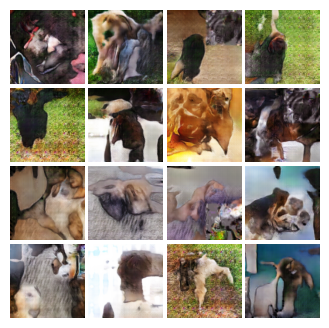

Iter: 1575, D: 1.876, G:1.138


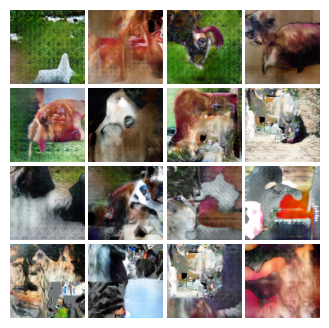

EPOCH:  11
Iter: 1650, D: 1.322, G:2.04


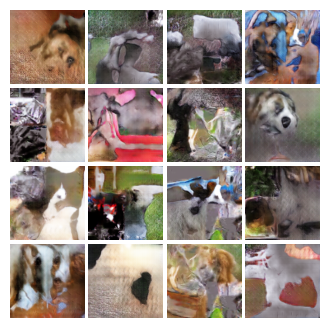

Iter: 1725, D: 0.5887, G:1.133


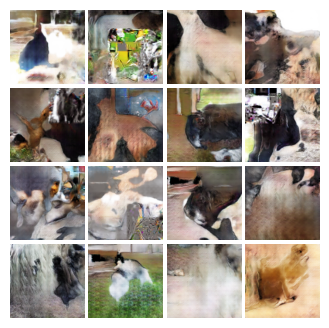

EPOCH:  12
Iter: 1800, D: 0.8483, G:1.153


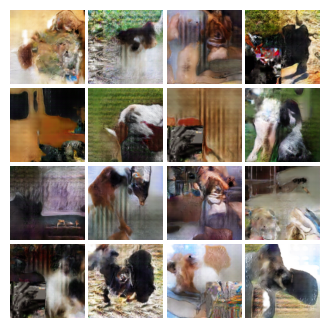

Iter: 1875, D: 1.292, G:2.013


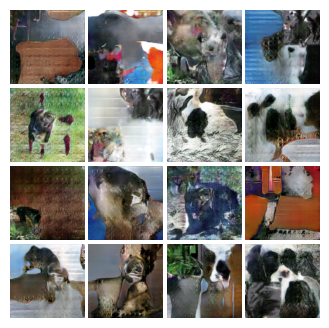

EPOCH:  13
Iter: 1950, D: 0.8346, G:0.6355


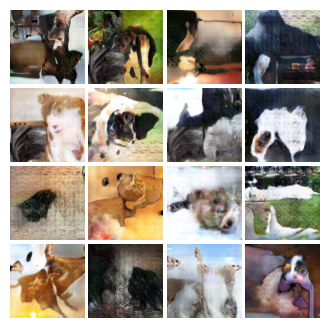

Iter: 2025, D: 0.8769, G:1.548


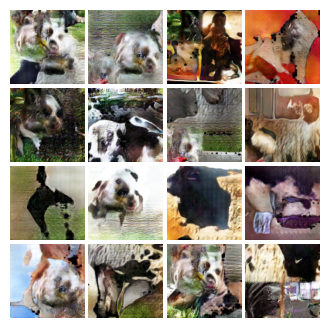

EPOCH:  14
Iter: 2100, D: 0.6418, G:1.245


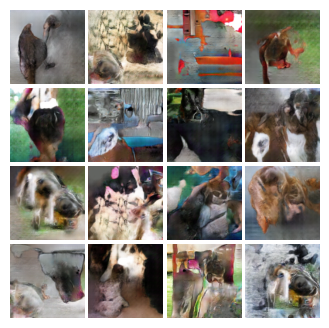

Iter: 2175, D: 0.5322, G:1.32


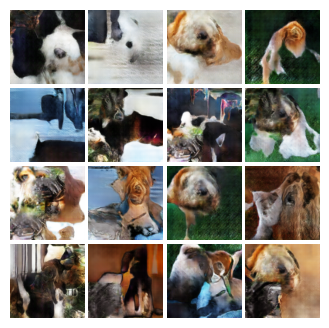

EPOCH:  15
Iter: 2250, D: 0.6965, G:1.319


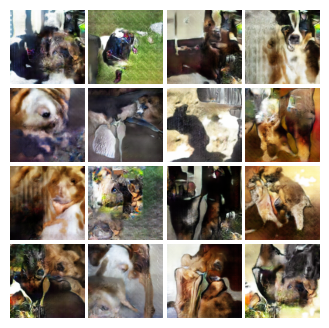

Iter: 2325, D: 0.586, G:1.038


In [ ]:
latent_dim = 50
imsize = 128
lr = 0.001

device = torch.device("cuda" if torch.cuda.is_available() else "gpu")

D = Discriminator().to(device)
G = Generator(noise_dim=latent_dim, imsize=imsize).to(device)

iter_no = 15975
model_load_path = "checkpoints_/2023-04-14 01:39:15.367396/{}/iter_{}.pth"
if model_load_path is not None:
    D.load_state_dict(torch.load(model_load_path.format("discriminator", iter_no)))
    G.load_state_dict(torch.load(model_load_path.format("generator", iter_no)))

D_optimizer = torch.optim.Adam(D.parameters(), lr=lr, betas = (0.5, 0.999))
G_optimizer = torch.optim.Adam(G.parameters(), lr=lr, betas = (0.5, 0.999))

main(
    discriminator = D,
    generator = G,
    d_optimizer = D_optimizer,
    g_optimizer = G_optimizer,
    expt = "non-cropped", 
    imsize = imsize,
    batch_size = 128,
    latent_dim = latent_dim,
    epochs = 50,
    lr = lr, 
    num_images = 1024, 
    dog_class = None
)